In [5]:

import matplotlib.pyplot as plt
from image_loader import CoinDataset
from torch.utils.data import DataLoader
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.preprocessing import StandardScaler

In [ ]:

obverse_folder = r"F:\data_ba\kleinsilber_linz\kleinsilber_linz\obverse"
reverse_folder = r"F:\data_ba\kleinsilber_linz\kleinsilber_linz\reverse"


dataset_obverse = CoinDataset(obverse_folder, reverse_folder, label="obverse")
dataset_reverse = CoinDataset(obverse_folder, reverse_folder, label="reverse")
# dataloader = DataLoader(dataset_obverse, batch_size=16, shuffle=False)


In [ ]:
# feature_extractor = FeatureExtractor(dataset_obverse, "obverse")
# # (array[features], array[image_names])
# r = feature_extractor.load_features("obverse_features.npy", "obverse_filenames.txt")
# features = np.array(r[0])
# image_names = np.array(r[1])
# df = pd.DataFrame(features, index=image_names, columns=[f"Feature_{i+1}" for i in range(features.shape[1])])

In [6]:
data = pd.read_csv("obverse_features.csv")
features_ = data.iloc[:, 1:].values
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features_)

In [132]:
data

array([[ 0.57517932, -0.05905677, -1.11411796, ...,  1.17013605,
        -0.27982006,  0.64013667],
       [-0.89764477,  0.1910919 , -0.92282287, ..., -0.45581608,
        -0.99505957,  0.21581073],
       [ 0.61854414, -1.01744319,  0.33805526, ..., -0.32089129,
         0.47202289, -0.52509747],
       ...,
       [-0.61509633, -0.36301133, -0.56616882, ...,  0.08194356,
         0.66832543,  0.36242875],
       [-0.60125508,  1.98821723, -0.19060009, ..., -1.07903497,
        -0.79535417,  1.79158967],
       [-0.86602286, -0.47911553,  0.18890053, ..., -1.25228337,
        -0.35074966, -1.22214615]])

In [7]:
features_scaled.shape

(741, 2048)

In [8]:
similarity_matrix = cosine_similarity(features_scaled)

In [9]:
similarity_df = pd.DataFrame(similarity_matrix)

In [10]:
similarity_df


,0,1,2,3,4,5,6,7,8,9,...,731,732,733,734,735,736,737,738,739,740
0,1.000000,0.258744,0.104194,0.238674,0.265796,0.022181,0.202032,0.129254,0.398737,0.211060,...,0.054497,0.036354,-0.205856,-0.140658,0.289247,-0.301794,0.258568,-0.102303,-0.103312,0.342002
1,0.258744,1.000000,-0.128258,0.242112,0.266341,0.125821,0.113507,0.193849,0.151895,0.281200,...,0.471330,0.311196,-0.207166,0.226454,0.262782,-0.257565,-0.138243,0.147202,0.294040,0.402238
2,0.104194,-0.128258,1.000000,0.188363,0.126152,0.255974,0.019811,-0.045440,0.104597,0.052827,...,-0.147225,-0.125071,-0.154961,-0.132844,0.105026,-0.172265,0.199815,0.020637,-0.047328,-0.119829
3,0.238674,0.242112,0.188363,1.000000,0.352686,0.059253,0.327117,0.250621,0.314746,0.240880,...,0.240969,0.124177,-0.253139,0.058965,0.283534,-0.110175,0.094023,0.007504,0.109320,0.139712
4,0.265796,0.266341,0.126152,0.352686,1.000000,0.348505,0.525390,0.434208,0.549449,0.605990,...,0.100507,-0.065831,-0.262386,0.028317,0.055240,-0.229546,0.181214,0.021744,0.009546,-0.017734
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
736,-0.301794,-0.257565,-0.172265,-0.110175,-0.229546,-0.165518,-0.199281,-0.237630,-0.381350,-0.240418,...,-0.159330,-0.108993,0.217780,-0.041166,-0.228842,1.000000,-0.132202,-0.036263,-0.093064,-0.186574
737,0.258568,-0.138243,0.199815,0.094023,0.181214,-0.077278,0.215462,0.061745,0.323873,0.029281,...,-0.263456,-0.329144,-0.299709,-0.242285,-0.026953,-0.132202,1.000000,-0.082790,-0.273853,-0.040413
738,-0.102303,0.147202,0.020637,0.007504,0.021744,-0.041689,-0.007944,0.114847,0.013120,0.084824,...,0.085672,-0.072598,-0.042598,0.146880,0.132361,-0.036263,-0.082790,1.000000,0.220399,-0.024267
739,-0.103312,0.294040,-0.047328,0.109320,0.009546,0.007951,0.052004,0.113208,-0.028157,0.053163,...,0.268784,0.104377,-0.047054,0.277048,0.124123,-0.093064,-0.273853,0.220399,1.000000,0.181067


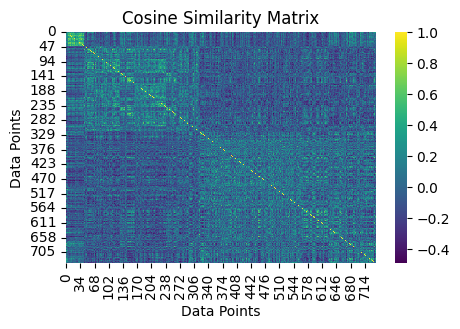

In [12]:
# Display heatmap of the similarity matrix
plt.figure(figsize=(5, 3))
sns.heatmap(similarity_df, cmap='viridis')
plt.title('Cosine Similarity Matrix')
plt.xlabel('Data Points')
plt.ylabel('Data Points')
plt.show()

In [13]:
similarity_df.to_csv("similarity_matrix_obverse.csv", index=False)

In [14]:
obverse_features_path = r"obverse_features.npy"
obverse_filenames_path = r"obverse_filenames.txt"
reverse_features_path = r"reverse_features.npy"
reverse_filenames_path = r"reverse_filenames.txt"

In [15]:
# Load features and filenames
obverse_features = np.load(obverse_features_path)
reverse_features = np.load(reverse_features_path)
with open(obverse_filenames_path, "r") as f:
    obverse_filenames = f.read().splitlines()

with open(reverse_filenames_path, "r") as f:
    reverse_filenames = f.read().splitlines()

# Combine features and filenames
all_features = np.vstack((obverse_features, reverse_features))
all_filenames = obverse_filenames + reverse_filenames

In [16]:
combined_data = pd.DataFrame({
    "filename": all_filenames,
    "features": list(all_features)
})

In [24]:
combined_data


,filename,features
0,00012a00.jpg,"[0.17683404684066772, 0.18339690566062927, 0.0..."
1,00016a00.jpg,"[0.005457614082843065, 0.22231285274028778, 0...."
2,00020a00.jpg,"[0.1818799376487732, 0.03429950401186943, 0.31..."
3,00022a00.jpg,"[0.1842089146375656, 0.04697689786553383, 0.02..."
4,00024a00.jpg,"[0.18232423067092896, 0.23897521197795868, 0.3..."
...,...,...
1476,Regensburg3505_r.jpg,"[0.07092437148094177, 0.0341845341026783, 0.12..."
1477,Regensburg3507_r.jpg,"[0.13412146270275116, 0.1525358110666275, 0.24..."
1478,UlM003_r.jpg,"[0.0383346863090992, 0.1361103057861328, 0.153..."
1479,ZiA0001_r.jpg,"[0.03994524106383324, 0.501893937587738, 0.222..."


In [25]:
features_array = np.array(combined_data['features'].tolist())
features_array.shape

(1481, 2048)

In [26]:
standardized_features_all = scaler.fit_transform(features_array)

In [27]:
standardized_features_all.shape

(1481, 2048)

In [28]:
combined_data['features'] = list(standardized_features_all)

In [30]:
combined_data.head()

,filename,features
0,00012a00.jpg,"[0.575179316213791, -0.05905676505761232, -1.1..."
1,00016a00.jpg,"[-0.8976447694074018, 0.1910918967128578, -0.9..."
2,00020a00.jpg,"[0.6185441441309073, -1.0174431925945788, 0.33..."
3,00022a00.jpg,"[0.6385595765258518, -0.9359538971975011, -1.2..."
4,00024a00.jpg,"[0.6223624373091131, 0.2981962376841936, 0.551..."


In [31]:
combined_data.to_pickle("all_data_standardized.pkl")

In [32]:
data = np.array(combined_data["features"].to_list())

In [33]:
data.shape

(1481, 2048)

In [34]:
similarity_matrix_all = cosine_similarity(data)

In [35]:
similarity_matrix_all_df = pd.DataFrame(similarity_matrix_all)

In [36]:
similarity_matrix_all_df.to_csv("similarity_matrix_all.csv")

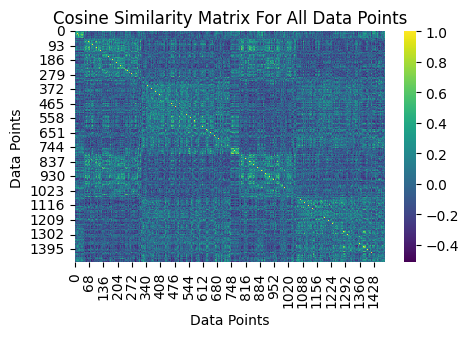

In [37]:
# Display heatmap of the similarity matrix
plt.figure(figsize=(5, 3))
sns.heatmap(similarity_matrix_all_df, cmap='viridis')
plt.title('Cosine Similarity Matrix For All Data Points')
plt.xlabel('Data Points')
plt.ylabel('Data Points')
plt.show()

In [38]:
similarity_matrix_all_df

,0,1,2,3,4,5,6,7,8,9,...,1471,1472,1473,1474,1475,1476,1477,1478,1479,1480
0,1.000000,0.245233,0.105498,0.243425,0.256727,-0.006881,0.184376,0.116877,0.384983,0.189080,...,0.207401,0.074962,0.034822,-0.061635,-0.058246,-0.193116,0.062074,-0.143471,0.173952,-0.135276
1,0.245233,1.000000,-0.152663,0.236285,0.230401,0.061324,0.069045,0.156759,0.095566,0.233132,...,0.330709,0.211707,0.340481,0.123734,0.241657,-0.004485,-0.133764,-0.290936,0.059887,0.249968
2,0.105498,-0.152663,1.000000,0.193863,0.099268,0.232471,-0.007737,-0.068094,0.077051,0.014622,...,-0.153818,-0.176196,-0.050329,-0.092608,-0.269480,0.055934,0.113781,0.000581,-0.129416,-0.081873
3,0.243425,0.236285,0.193863,1.000000,0.345310,0.024895,0.316908,0.240825,0.301114,0.223855,...,0.090850,0.077500,0.039754,0.040990,-0.112275,-0.069416,0.033329,-0.146434,0.003269,0.080836
4,0.256727,0.230401,0.099268,0.345310,1.000000,0.290357,0.508387,0.416002,0.526715,0.578148,...,0.204453,0.185574,0.122938,-0.002565,-0.000497,-0.006803,-0.107324,-0.184702,0.309762,-0.057947
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1476,-0.193116,-0.004485,0.055934,-0.069416,-0.006803,0.119154,-0.054652,-0.007035,-0.156003,0.044975,...,0.154275,0.118170,0.290980,0.387099,0.260291,1.000000,-0.253702,0.133586,-0.235320,0.224249
1477,0.062074,-0.133764,0.113781,0.033329,-0.107324,-0.074466,0.007235,0.032003,0.034624,-0.115572,...,-0.225703,-0.240359,-0.204031,-0.222954,-0.200723,-0.253702,1.000000,0.016526,0.040375,-0.150100
1478,-0.143471,-0.290936,0.000581,-0.146434,-0.184702,0.022011,-0.204005,-0.138005,-0.257903,-0.199686,...,-0.213835,-0.205811,-0.097440,-0.174246,0.006818,0.133586,0.016526,1.000000,-0.157658,-0.055635
1479,0.173952,0.059887,-0.129416,0.003269,0.309762,-0.016220,0.332134,0.380776,0.316521,0.252421,...,0.073374,0.110885,-0.062369,-0.038491,0.031069,-0.235320,0.040375,-0.157658,1.000000,-0.062028


In [41]:
data_names = combined_data["filename"].to_list()

In [42]:
similarity_matrix_all_df = pd.DataFrame(similarity_matrix_all, index=data_names, columns=data_names)

In [43]:
similarity_matrix_all_df

,00012a00.jpg,00016a00.jpg,00020a00.jpg,00022a00.jpg,00024a00.jpg,00025a00.jpg,00026a00.jpg,00027a00.jpg,00028a00.jpg,00029a00.jpg,...,Regensburg3483_r.jpg,Regensburg3484_r.jpg,Regensburg3485_r.jpg,Regensburg3486_r.jpg,Regensburg3504_r.jpg,Regensburg3505_r.jpg,Regensburg3507_r.jpg,UlM003_r.jpg,ZiA0001_r.jpg,Zia0023_r.jpg
00012a00.jpg,1.000000,0.245233,0.105498,0.243425,0.256727,-0.006881,0.184376,0.116877,0.384983,0.189080,...,0.207401,0.074962,0.034822,-0.061635,-0.058246,-0.193116,0.062074,-0.143471,0.173952,-0.135276
00016a00.jpg,0.245233,1.000000,-0.152663,0.236285,0.230401,0.061324,0.069045,0.156759,0.095566,0.233132,...,0.330709,0.211707,0.340481,0.123734,0.241657,-0.004485,-0.133764,-0.290936,0.059887,0.249968
00020a00.jpg,0.105498,-0.152663,1.000000,0.193863,0.099268,0.232471,-0.007737,-0.068094,0.077051,0.014622,...,-0.153818,-0.176196,-0.050329,-0.092608,-0.269480,0.055934,0.113781,0.000581,-0.129416,-0.081873
00022a00.jpg,0.243425,0.236285,0.193863,1.000000,0.345310,0.024895,0.316908,0.240825,0.301114,0.223855,...,0.090850,0.077500,0.039754,0.040990,-0.112275,-0.069416,0.033329,-0.146434,0.003269,0.080836
00024a00.jpg,0.256727,0.230401,0.099268,0.345310,1.000000,0.290357,0.508387,0.416002,0.526715,0.578148,...,0.204453,0.185574,0.122938,-0.002565,-0.000497,-0.006803,-0.107324,-0.184702,0.309762,-0.057947
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Regensburg3505_r.jpg,-0.193116,-0.004485,0.055934,-0.069416,-0.006803,0.119154,-0.054652,-0.007035,-0.156003,0.044975,...,0.154275,0.118170,0.290980,0.387099,0.260291,1.000000,-0.253702,0.133586,-0.235320,0.224249
Regensburg3507_r.jpg,0.062074,-0.133764,0.113781,0.033329,-0.107324,-0.074466,0.007235,0.032003,0.034624,-0.115572,...,-0.225703,-0.240359,-0.204031,-0.222954,-0.200723,-0.253702,1.000000,0.016526,0.040375,-0.150100
UlM003_r.jpg,-0.143471,-0.290936,0.000581,-0.146434,-0.184702,0.022011,-0.204005,-0.138005,-0.257903,-0.199686,...,-0.213835,-0.205811,-0.097440,-0.174246,0.006818,0.133586,0.016526,1.000000,-0.157658,-0.055635
ZiA0001_r.jpg,0.173952,0.059887,-0.129416,0.003269,0.309762,-0.016220,0.332134,0.380776,0.316521,0.252421,...,0.073374,0.110885,-0.062369,-0.038491,0.031069,-0.235320,0.040375,-0.157658,1.000000,-0.062028


In [46]:
similarity_matrix_all_df["UlM003_r.jpg"]["UlM003_a.jpg"]

0.3758326758699124

In [114]:
rev_filenames = reverse_filenames[:200]
len(rev_filenames)

200

In [115]:
obv_filenames = obverse_filenames[:200]

In [116]:
len(obv_filenames)

200

In [117]:
obverse_reverse_similarities = similarity_matrix_all_df.loc[obv_filenames, rev_filenames]

In [118]:
obverse_reverse_similarities.head(20)

,00012r00.jpg,00016r00.jpg,00020r00.jpg,00022r00.jpg,00024r00.jpg,00025r00.jpg,00026r00.jpg,00027r00.jpg,00028r00.jpg,00029r00.jpg,...,A.244_rev_box.jpg,A.245_rev_box.jpg,A.246_rev_box.jpg,A.247_rev_box.jpg,A.248_rev_box.jpg,A.249_rev_box.jpg,A.250_rev_box.jpg,A.251_rev_box.jpg,A.252_rev_box.jpg,A.253_rev_box.jpg
00012a00.jpg,0.256039,0.186454,0.192086,0.193990,0.127752,0.195345,0.217101,0.320464,0.218253,0.323726,...,0.169892,-0.241954,-0.187154,-0.174981,-0.268897,-0.053242,0.049893,-0.145402,-0.157240,-0.310424
00016a00.jpg,0.224263,0.374403,0.121584,0.304042,-0.076936,-0.090224,-0.084122,0.014355,-0.091041,-0.071376,...,-0.024497,-0.151504,0.138005,-0.069285,-0.028095,-0.264790,-0.070196,-0.266687,-0.259239,-0.096700
00020a00.jpg,0.196792,-0.070260,0.443703,-0.048939,0.310143,0.435667,0.307815,0.358450,0.292602,0.200592,...,0.008585,-0.081767,-0.027009,-0.231989,-0.214929,0.081801,0.027760,0.094798,0.115693,-0.113837
00022a00.jpg,0.315972,0.169576,0.224898,0.371122,0.175352,0.278913,0.130427,0.343850,0.176428,0.053788,...,-0.061869,-0.133613,0.138104,-0.068161,-0.170791,-0.010821,0.151537,-0.130508,-0.069009,-0.276819
00024a00.jpg,0.356863,0.386408,0.371165,0.425561,0.265853,0.106923,0.314001,0.415700,0.249131,0.174103,...,0.125487,-0.106056,-0.006630,-0.068427,-0.180084,-0.024393,0.155918,-0.006441,-0.044818,-0.227603
00025a00.jpg,0.142749,0.346653,0.396927,0.093878,0.061632,0.017035,0.040222,0.052239,-0.091481,-0.093519,...,0.094493,-0.016656,0.088937,-0.032703,-0.060960,-0.125004,0.015247,0.222709,0.028757,-0.030047
00026a00.jpg,0.356234,0.225023,0.214851,0.195648,0.260903,0.023345,0.311614,0.333564,0.250344,0.259636,...,0.072093,-0.153845,0.071764,-0.132969,-0.160678,0.006157,0.061847,-0.009004,-0.116855,-0.256629
00027a00.jpg,0.331565,0.193324,0.050306,0.202617,0.146499,0.032253,0.175235,0.257914,0.109217,0.090987,...,0.009191,-0.135869,0.171997,-0.118642,-0.023981,-0.084080,0.017005,-0.094283,-0.267785,-0.231195
00028a00.jpg,0.417017,0.416103,0.264035,0.108838,0.326841,0.082371,0.417533,0.432058,0.259727,0.264478,...,0.256538,-0.168654,-0.004488,-0.160665,-0.254902,-0.005931,0.222782,0.134714,-0.129034,-0.277558
00029a00.jpg,0.509281,0.422034,0.313937,0.268298,0.148181,-0.036271,0.213293,0.162876,0.041057,0.141061,...,0.011342,-0.192770,0.025339,-0.138001,-0.220890,-0.199797,-0.002757,-0.035898,-0.258187,-0.218911


In [119]:
obverse_reverse_similarities.mean().mean()

0.06780096440299642

In [120]:
obverse_reverse_similarities.values.max()

0.8332663592065999

In [121]:
obverse_reverse_similarities.values.min()

-0.40970980982442246

In [122]:
daig_values = np.diag(obverse_reverse_similarities.values)

In [123]:
daig_values.min()

-0.3280602629534576

In [124]:
daig_values.max()

0.6864298774758361

In [125]:
daig_values.mean()

0.196995576483614

In [126]:
similarity_matrix_all_df.mean().mean()

0.000988393110770353

In [105]:

# Get the upper triangle of the similarity matrix (excluding diagonal)
upper_triangle_values = similarity_matrix_all_df.values[np.triu_indices_from(similarity_matrix_all_df, k=1)]

# Count the number of pairs with similarity > 0.5
count_over_0_5 = np.sum(upper_triangle_values > 0.5)

print(f"Number of pairs with similarity over 0.5: {count_over_0_5}")

Number of pairs with similarity over 0.5: 5711


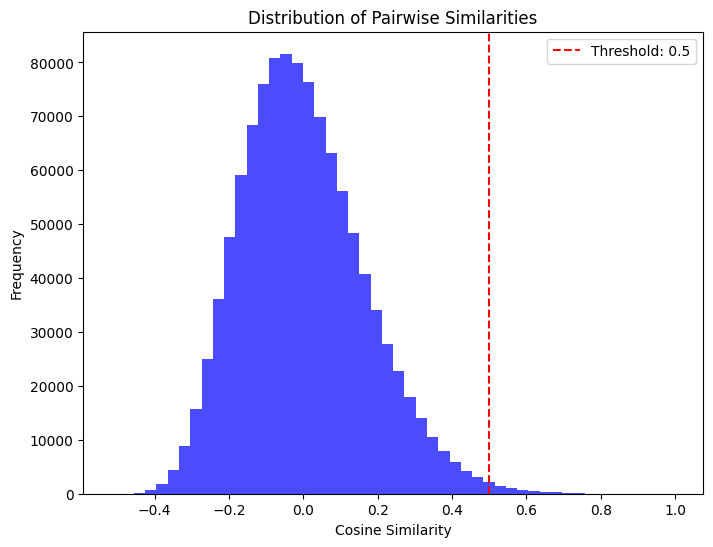

In [106]:
plt.figure(figsize=(8, 6))
plt.hist(upper_triangle_values, bins=50, color='blue', alpha=0.7)
plt.axvline(x=0.5, color='red', linestyle='--', label="Threshold: 0.5")
plt.title("Distribution of Pairwise Similarities")
plt.xlabel("Cosine Similarity")
plt.ylabel("Frequency")
plt.legend()
plt.show()

In [107]:
# Get indices of pairs with similarity > 0.5
over_0_5_indices = np.column_stack(np.where(np.triu(similarity_matrix_all_df.values, k=1) > 0.5))

# Map indices to filenames
over_0_5_pairs = [(similarity_matrix_all_df.index[i], similarity_matrix_all_df.columns[j]) for i, j in over_0_5_indices]

# Display results
print(f"Number of pairs with similarity over 0.5: {len(over_0_5_pairs)}")
print("Sample pairs with similarity over 0.5:")
print(over_0_5_pairs[:10])  # Display first 10 pairs

Number of pairs with similarity over 0.5: 5711
Sample pairs with similarity over 0.5:
[('00012a00.jpg', 'Irlbach39-14_a.jpg'), ('00016a00.jpg', 'Irlbach39-18_a.jpg'), ('00016a00.jpg', 'Regensburg3393_a.jpg'), ('00022a00.jpg', 'K0963_a.jpg'), ('00024a00.jpg', '00026a00.jpg'), ('00024a00.jpg', '00028a00.jpg'), ('00024a00.jpg', '00029a00.jpg'), ('00024a00.jpg', '00030a00.jpg'), ('00024a00.jpg', '00032a00.jpg'), ('00024a00.jpg', '00035a00.jpg')]


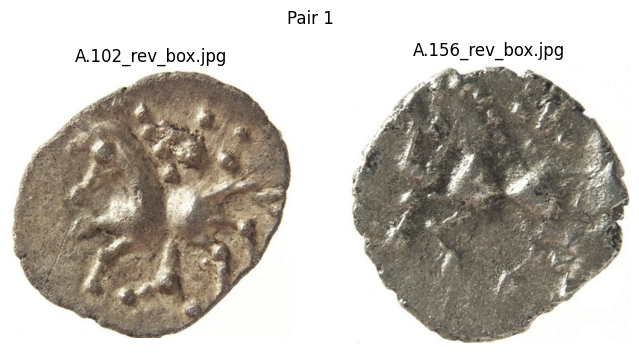

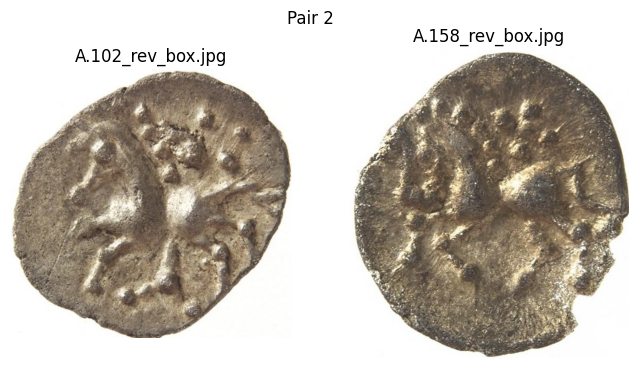

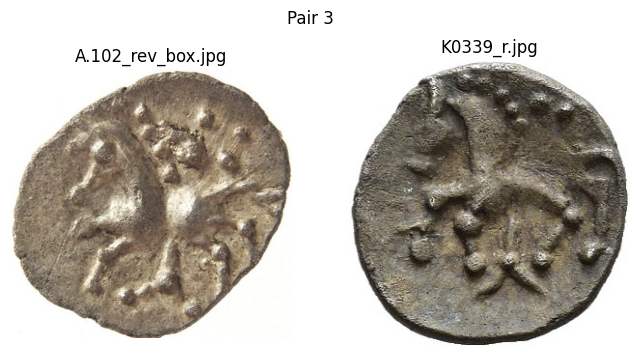

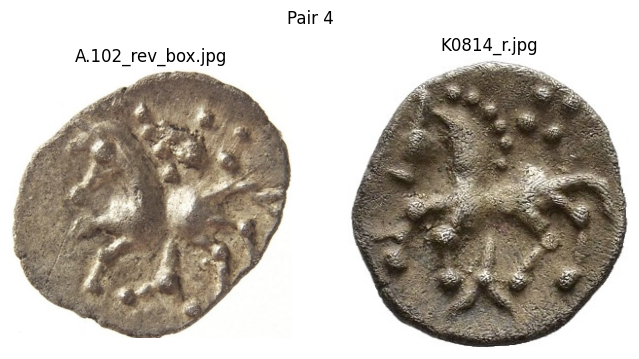

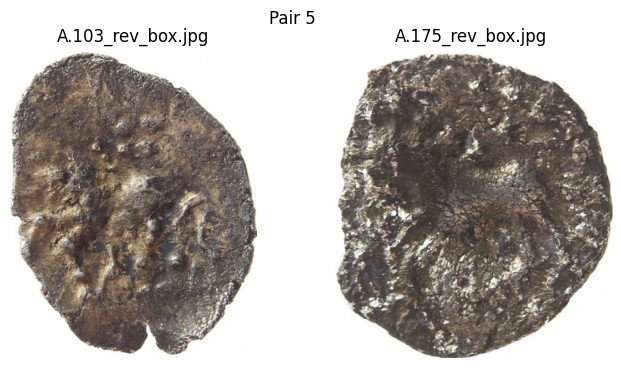

...

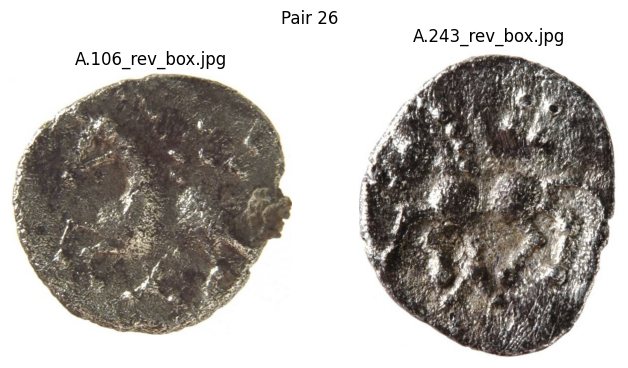

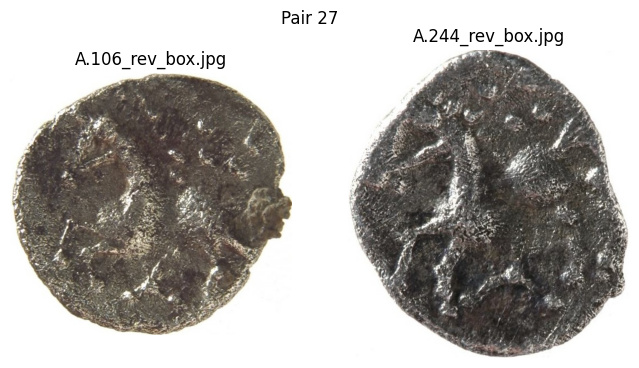

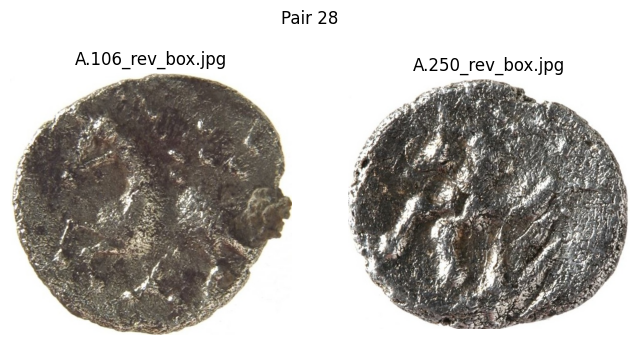

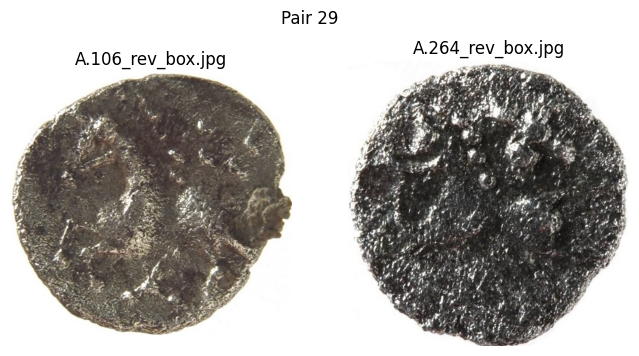

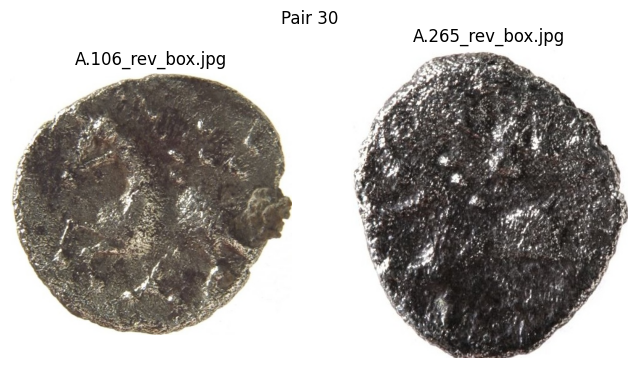

In [131]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Define folders
obverse_folder = r"F:\data_ba\kleinsilber_linz\kleinsilber_linz\obverse"
reverse_folder = r"F:\data_ba\kleinsilber_linz\kleinsilber_linz\reverse"

def get_image_path(filename):
    """
    Return the path to the image file by checking both folders.
    """
    obverse_path = os.path.join(obverse_folder, filename)
    reverse_path = os.path.join(reverse_folder, filename)
    
    if os.path.exists(obverse_path):
        return obverse_path
    elif os.path.exists(reverse_path):
        return reverse_path
    else:
        raise FileNotFoundError(f"File {filename} not found in either folder.")

# Display the first 10 pairs with similarity > 0.5
for idx, (file1, file2) in enumerate(over_0_5_pairs[4000:4030]):
    try:
        # Get image paths
        path1 = get_image_path(file1)
        path2 = get_image_path(file2)

        # Load the images
        img1 = Image.open(path1)
        img2 = Image.open(path2)

        # Plot the pair
        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(img1)
        plt.title(f"{file1}")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(img2)
        plt.title(f"{file2}")
        plt.axis("off")

        plt.suptitle(f"Pair {idx+1}")
        plt.show()
    except FileNotFoundError as e:
        print(e)


In [133]:
df_t = pd.read_pickle("all_data_standardized.pkl")

In [134]:
df_t

,filename,features
0,00012a00.jpg,"[0.575179316213791, -0.05905676505761232, -1.1..."
1,00016a00.jpg,"[-0.8976447694074018, 0.1910918967128578, -0.9..."
2,00020a00.jpg,"[0.6185441441309073, -1.0174431925945788, 0.33..."
3,00022a00.jpg,"[0.6385595765258518, -0.9359538971975011, -1.2..."
4,00024a00.jpg,"[0.6223624373091131, 0.2981962376841936, 0.551..."
...,...,...
1476,Regensburg3505_r.jpg,"[-0.33501771764881144, -1.0181822101718503, -0..."
1477,Regensburg3507_r.jpg,"[0.20810362403654806, -0.2574294655256071, -0...."
1478,UlM003_r.jpg,"[-0.6150963287594168, -0.363011327799421, -0.5..."
1479,ZiA0001_r.jpg,"[-0.6012550800193638, 1.9882172265363778, -0.1..."


In [137]:
v = df_t.iloc[0]

In [141]:
v[0]

C:\Users\Kenan\AppData\Local\Temp\ipykernel_299848\1572725389.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  v[0]


'00012a00.jpg'